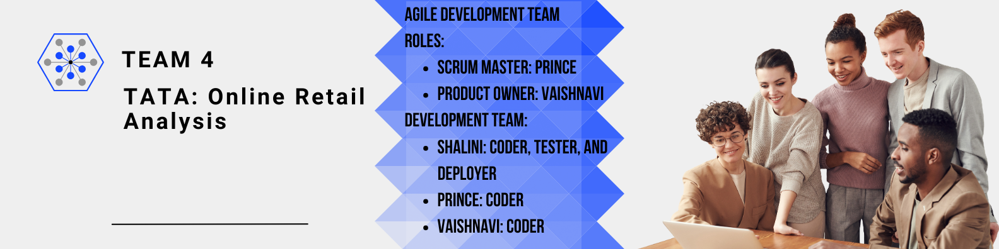

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
sns.set()

In [ ]:
import kagglehub
kagglehub.login()
#{"username":"princejaniya","key":"fcb4873c219cd2e543c92c01e4377ae2"}

In [ ]:
import kagglehub

path = kagglehub.dataset_download("ishanshrivastava28/tata-online-retail-dataset",force_download=True)
print("Path to dataset files:",path)

100%|██████████| 29.0M/29.0M [00:00<00:00, 85.6MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/ishanshrivastava28/tata-online-retail-dataset/versions/1


In [ ]:
import os
path = os.path.expanduser("/root/.cache/kagglehub/datasets/ishanshrivastava28/tata-online-retail-dataset/versions/1")
file_path = os.path.join(path, 'Online Retail Data Set.csv')
df = pd.read_csv(file_path, encoding='latin1')

In [ ]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 08:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 08:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 08:26,3.39,17850.0,United Kingdom


# **Data Dictionary** <br>
## **Data fields:**<br>
**1.InvoiceNo:** Unique invoice number.

**2.StockCode:** Unique product identifier.

**3.Description:** Product description.

**4.Quantity:** Number of items sold.

**5.InvoiceDate:** Date and time of invoice.

**6.UnitPrice:** Price per item.

**7.CustomerID:** Unique customer identifier.

**8.Country:** Country of purchase.

## Checking the Dimension of the dataset

In [ ]:
df.shape

(541909, 8)

There are 541909 Observations / Rows and 8 Attributes / Columns.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


### Our dataset is composed of 541909 rows and 8 columns. When going through the columns, we notice that we have some missing values in the CustomerID column, as it only has 406829 values.<br> Also the column Description has missing values. So, that should be considered when applying exploration to our dataset.

>## **Checking for missing values.**

In [ ]:
df.isnull().sum()

,0
InvoiceNo,0
StockCode,0
Description,1454
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,135080
Country,0


>Observations<br>
>'Description' and 'CustomerID' columns have null values.<br>

>Lets check if we can fill CustomerID from InvoiceNo

In [ ]:
description_impute = df.groupby('StockCode')['Description'].apply(lambda x: x.mode()[0] if not x.mode().empty else "Unknown Item")
df['Description'] = df.apply(lambda row: description_impute[row['StockCode']] if pd.isnull(row['Description']) else row['Description'], axis=1)

In [ ]:
df['CustomerID'] = df['CustomerID'].fillna(-1)

<span style="font-family: Arial; font-weight: bold; font-size: 1.5em; color: #000000;">Identify and count duplicate rows in the dataset</span>

In [ ]:
duplicate_rows = df[df.duplicated()]
print(f"Number of duplicate rows: {duplicate_rows.shape[0]}")
print(duplicate_rows.head())

In [ ]:
# Check for duplicate rows based on specific columns
subset_duplicates = df[df.duplicated(subset=['InvoiceNo', 'StockCode'])]
print(f"Number of duplicate rows based on InvoiceNo and StockCode: {subset_duplicates.shape[0]}")
print(subset_duplicates.head())

In [ ]:
df['is_duplicate'] = df.duplicated(keep=False)
print(df[df['is_duplicate']].head())

### Removing Duplicate Rows

In [ ]:
df1 = df.drop_duplicates()

In [ ]:
df1 = df.drop_duplicates(keep='last')

In [ ]:
df1 = df.drop_duplicates(subset=['InvoiceNo', 'StockCode'])

In [ ]:
df1 = df.groupby(['InvoiceNo', 'StockCode'], as_index=False).agg({
    'Quantity': 'sum',        # Sum quantities for duplicates
    'UnitPrice': 'mean',      # Take average price
    'Description': 'first',   # Retain the first description
    'CustomerID': 'first',    # Retain the first customer ID
    'Country': 'first'        # Retain the first country
})

In [ ]:
remaining_duplicates = df1[df1.duplicated()]
print(f"Number of remaining duplicate rows: {remaining_duplicates.shape[0]}")
print(remaining_duplicates.head())

In [ ]:
print(f"Number of duplicate rows after final cleanup: {df1.duplicated().sum()}")

### Separating categorical and numerical columns

In [ ]:
categorical_cols = df1.select_dtypes(include='object').columns
numerical_cols = df1.select_dtypes(include=['int64', 'float64']).columns
print("Categorical Columns:", categorical_cols)
print("Numerical Columns:", numerical_cols)

## Outliers detection and handling

In [ ]:
plt.figure(figsize=(12,8))
for i, col in enumerate(numerical_cols, 1):
  if col != 'CustomerID':  # Exclude 'CustomerID'
    plt.subplot(2, 3, i)  # Adjust subplot dimensions as needed
    sns.boxplot(x=df1[col])
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

In [ ]:
Q1 = df1[numerical_cols].quantile(0.25)
Q3 = df1[numerical_cols].quantile(0.75)
IQR = Q3 - Q1
# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [ ]:
df2 = df1.copy()
for col in numerical_cols:
    df1[col] = df1[col].clip(lower=lower_bound[col], upper=upper_bound[col])

In [ ]:
plt.figure(figsize=(12,8))
for i, col in enumerate(numerical_cols, 1):
  if col != 'CustomerID':  # Exclude 'CustomerID'
    plt.subplot(2, 3, i)
    sns.boxplot(x=df1[col])
    plt.title(f'Boxplot of {col} (Clipped)')
plt.tight_layout()
plt.show()

> # **Exploratory Data Analysis**

In [ ]:
df.describe()

In [ ]:
df1['Total_sales'] = df1['Quantity'] * df1['UnitPrice']

In [ ]:
columns_to_plot = ['Quantity', 'UnitPrice', 'Total_sales']
plt.figure(figsize=(12, 10))

for i, col in enumerate(columns_to_plot, start=1):
    plt.subplot(2, 2, i)

    # Calculate mean, median, and mode using appropriate methods
    mean_value = df1[col].mean()
    median_value = df1[col].median()
    mode_value = df1[col].mode()[0]

    if isinstance(df1[col], pd.Series) and not df1[col].empty:
        values = df1[col].dropna()
        plt.hist(values, bins=30, alpha=0.7, label='Data Distribution', color='skyblue')
    else:
        values = np.random.normal(loc=mean_value, scale=df1[col]['std'], size=int(df1[col]['count']))
        plt.hist(values, bins=30, alpha=0.7, label='Data Distribution', color='skyblue')

    plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label='Mean')
    plt.axvline(median_value, color='green', linestyle='dashed', linewidth=2, label='Median')
    plt.axvline(mode_value, color='purple', linestyle='dashed', linewidth=2, label='Mode')

    plt.title(col)
    plt.xlabel("Value")
    plt.ylabel("Frequency")
    plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
columns_to_plot = ['Quantity', 'UnitPrice', 'Total_sales']
plt.figure(figsize=(10, 6))
for col in columns_to_plot:
    mean_value = df1[col].mean()
    median_value = df1[col].median()
    mode_value = df1[col].mode()[0]
    values = np.random.normal(loc=mean_value, scale=df1[col].std(), size=len(df1[col]))
    plt.hist(values, bins=30, alpha=0.5, label=f'{col} Distribution', edgecolor='black')
    plt.axvline(mean_value, color='red', linestyle='dashed', linewidth=2, label=f'{col} Mean')
    plt.axvline(median_value, color='green', linestyle='dashed', linewidth=2, label=f'{col} Median')
    plt.axvline(mode_value, color='purple', linestyle='dashed', linewidth=2, label=f'{col} Mode')
plt.title("Histograms for Quantity, UnitPrice, and Total_sales")
plt.xlabel("Values")
plt.ylabel("Frequency")
plt.legend(loc='upper right')
plt.show()


### Insights:
- **Quantity**: Most items are sold in small quantities, but a few items are sold in large quantities. The distribution is right-skewed.
- **UnitPrice**: Prices are generally low, with a few high-priced items. The distribution shows a right-skew.
- **Total Sales**: Sales follow a similar pattern to UnitPrice, with a few items contributing to higher sales.
- **Revenue Per Invoice**: Most invoices generate low revenue, but a small number generate significantly higher revenue.

### Recommendations:
- **Focus on High-Volume Products**: Identify and promote products with high quantities sold to boost sales.
- **Price Optimization**: Explore pricing strategies for higher-priced products to increase revenue.
- **Target High-Value Customers**: Focus on customers who generate the most revenue per invoice.
- **Enhance Product Offerings**: Consider introducing more high-value products to increase overall revenue.


# **Geographic Insights**

In [ ]:
import plotly.express as px
df1['Total_sales'] = df1['Quantity'] * df1['UnitPrice']
fig = px.histogram(df1, x="Total_sales", y='Country')
fig.update_layout(title="Histogram of Sales Country Wise", xaxis_title="Total_sales", yaxis_title="Country")
fig.show()

In [ ]:
country_sales = df1.groupby('Country')['Total_sales'].sum().reset_index()
fig = px.treemap(country_sales, path=['Country'], values='Total_sales', title='Hierarchical Sales by Country')
fig.update_layout(template='plotly_dark')
fig.show()

> # **Expansion area: Total Sales by Country above 50k sales(Excluding United Kingdom)**

In [ ]:
country_sales = df1[df1['Country'] != 'United Kingdom'].groupby('Country')['Total_sales'].sum().reset_index()
country_sales = country_sales[country_sales['Total_sales'] > 50000]
fig = px.bar(country_sales, x='Country', y='Total_sales', title='Geographic Insights: Total Sales by Country (Excluding United Kingdom)', template='plotly_dark', color='Total_sales', color_continuous_scale='Viridis')
fig.update_layout(xaxis_title='Country', yaxis_title='Total Sales', title_font_size=18)
fig.show()

### Top products in UK

In [ ]:
england_data = df1[df1['Country'] == 'United Kingdom']
top_products_england = england_data.groupby('Description')['Total_sales'].sum().reset_index()
top_products_england = top_products_england.sort_values(by='Total_sales', ascending=False).head(10)

fig = px.bar(top_products_england, x='Description', y='Total_sales', title='Top 10 Products Sold in England by Total Sales', text='Total_sales')
fig.update_layout(template='plotly_dark', xaxis_title='Product Description', yaxis_title='Total Sales')
fig.show()

### Insights
1. **Top Performer**: "DOTCOM POSTAGE" leads with significantly higher sales (~202k), making it a key revenue driver.
2. **Popular Products**: Items like "REGENCY CAKESTAND 3 TIER" and "WHITE HANGING HEART T-LIGHT HOLDER" also perform strongly, with over 90k in sales.
3. **Seasonal Influence**: Products like "PAPER CHAIN KIT 50'S CHRISTMAS" and "CHILLI LIGHTS" suggest demand spikes during festive periods.
4. **Sales Gap**: The difference between top and lower-ranked items highlights opportunities to boost sales for underperforming products.

### Recommendations
1. **Stock Optimization**: Ensure sufficient inventory for high-demand products, especially "DOTCOM POSTAGE."
2. **Seasonal Promotions**: Leverage festive seasons to promote related items like "PAPER CHAIN KIT."
3. **Upselling Opportunities**: Bundle top-selling items with lower-performing ones to increase overall sales.
4. **Marketing Focus**: Allocate more marketing efforts to mid-tier products (e.g., "JUMBO BAG RED RETROSPOT") to close the sales gap.


# Product Analysis

## Countries buying the top selling products

In [ ]:
top_products = (
    df1.groupby('StockCode')['Total_sales']
    .sum()
    .nlargest(10)
    .index
)
top_product_data = df1[df1['StockCode'].isin(top_products)]
country_top_sales = (
    top_product_data.groupby(['Country', 'StockCode'])['Total_sales']
    .sum()
    .reset_index()
)
fig = px.scatter(
    country_top_sales,
    x='Country',
    y='Total_sales',
    color='StockCode',
    title='Countries Buying the Top Selling Products',
    labels={'StockCode': 'Top-Selling Products'},
    template='plotly_dark',
)
fig.update_layout(
    xaxis_title='Country',
    yaxis_title='Total Sales',
    title_font_size=18,
    legend_title='Product Code',
)
fig.show()


## Top popular products

In [ ]:
top_products = 30
popular_products = df['Description'].value_counts().head(top_products).reset_index()
popular_products.columns = ['Description', 'Count']
fig = px.bar(popular_products, x='Description', y='Count', title='Top Popular Products')
fig.update_layout(template='plotly_dark')
fig.show()


In [ ]:
print(popular_products)

                           Description  Count
0   WHITE HANGING HEART T-LIGHT HOLDER   2369
1             REGENCY CAKESTAND 3 TIER   2200
2              JUMBO BAG RED RETROSPOT   2159
3                        PARTY BUNTING   1727
4              LUNCH BAG RED RETROSPOT   1638
5        ASSORTED COLOUR BIRD ORNAMENT   1501
6    SET OF 3 CAKE TINS PANTRY DESIGN    1477
7      PACK OF 72 RETROSPOT CAKE CASES   1385
8              LUNCH BAG  BLACK SKULL.   1350
9      NATURAL SLATE HEART CHALKBOARD    1280
10                             POSTAGE   1256
11             JUMBO BAG PINK POLKADOT   1251
12               HEART OF WICKER SMALL   1239
13            JAM MAKING SET WITH JARS   1229
14              JUMBO STORAGE BAG SUKI   1214
15     PAPER CHAIN KIT 50'S CHRISTMAS    1210
16   JUMBO SHOPPER VINTAGE RED PAISLEY   1202
17                 LUNCH BAG CARS BLUE   1197
18          LUNCH BAG SPACEBOY DESIGN    1192
19              JAM MAKING SET PRINTED   1182
20     RECIPE BOX PANTRY YELLOW DE

In [ ]:
num_top_items = 30
best_selling_items = df.groupby('Description')['Quantity'].sum().sort_values(ascending=False).head(num_top_items).reset_index()
best_selling_items.columns = ['Description', 'Total Quantity Sold']
fig = px.bar(best_selling_items, x='Description', y='Total Quantity Sold', title='Top Best-Selling Items')
fig.update_layout(template='plotly_dark')
fig.show()

In [ ]:
num_top_products = 5
low_profit_products = df1.groupby('Description')['Total_sales'].sum().sort_values().head(num_top_products).reset_index()
low_profit_products.columns = ['Description', 'Total Sales']
fig_low_profit = px.bar(low_profit_products, x='Description', y='Total Sales', title='Top Low-Profit Products')
fig_low_profit.update_layout(template='plotly_dark')
fig_low_profit.show()

In [ ]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,is_duplicate
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01-12-2010 08:26,2.55,17850.0,United Kingdom,False
1,536365,71053,WHITE METAL LANTERN,6,01-12-2010 08:26,3.39,17850.0,United Kingdom,False
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01-12-2010 08:26,2.75,17850.0,United Kingdom,False
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01-12-2010 08:26,3.39,17850.0,United Kingdom,False
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01-12-2010 08:26,3.39,17850.0,United Kingdom,False
...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,09-12-2011 12:50,0.85,12680.0,France,False
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,09-12-2011 12:50,2.10,12680.0,France,False
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,09-12-2011 12:50,4.15,12680.0,France,False
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,09-12-2011 12:50,4.15,12680.0,France,False


> # **Total_sales vs Quantity**

In [ ]:
fig = px.scatter(
    df1,
    x='Quantity',
    y='Total_sales',
    title='Bivariate Analysis: Total Sales vs Quantity',
    template='plotly_dark',
)
fig.update_layout(
    xaxis_title='Quantity Sold',
    yaxis_title='Total Sales',
    title_font_size=18
)
fig.show()


# Sales by time

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], dayfirst=True, errors='coerce')
df['Year'] = df['InvoiceDate'].dt.year
df['Month'] = df['InvoiceDate'].dt.month
df['Day'] = df['InvoiceDate'].dt.day
df['Hour'] = df['InvoiceDate'].dt.hour

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], dayfirst=True, errors='coerce')
df['Day'] = df['InvoiceDate'].dt.day
df['Total_sales'] = df['Quantity'] * df['UnitPrice']
fig = px.histogram(df, x="Day", y="Total_sales")
fig.update_layout(title="Histogram of Sales Daily", xaxis_title="Day", yaxis_title="Total_sales")
fig.show()

In [ ]:
df['Year'] = df['InvoiceDate'].dt.year
df_2010 = df[df['Year'] == 2010]
df_2010['Total_sales'] = df_2010['Quantity'] * df_2010['UnitPrice']
avg_sales_2010 = df_2010.groupby('Day')['Total_sales'].mean().reset_index()
fig_2010 = px.histogram(avg_sales_2010, x="Day", y="Total_sales", title="Average Sales per Day in 2010")
fig_2010.update_layout(xaxis_title="Day", yaxis_title="Average Sales", template="plotly_dark")
fig_2010.show()


In [ ]:
df_2011 = df[df['Year'] == 2011]
df_2011['Total_sales'] = df_2011['Quantity'] * df_2011['UnitPrice']
avg_sales_2011 = df_2011.groupby('Day')['Total_sales'].mean().reset_index()
fig_2011 = px.histogram(avg_sales_2011, x="Day", y="Total_sales", title="Average Sales per Day in 2011")
fig_2011.update_layout(xaxis_title="Day", yaxis_title="Average Sales", template="plotly_dark")
fig_2011.show()


In [ ]:
df['Hour'] = df['InvoiceDate'].dt.hour
hourly_sales = df.groupby('Hour')['Total_sales'].mean().reset_index()
fig = px.line(hourly_sales, x='Hour', y='Total_sales', title='Average Sales by Hour')
fig.update_layout(xaxis_title='Hour', yaxis_title='Average Sales')
fig.show()

In [ ]:
import pylab
sales = df.set_index('InvoiceDate')['Total_sales']
def plotSales(sales, time_freq, xtick, freq):
    trend = sales.resample(time_freq).sum()
    holidays = ['2010-12-27', '2010-12-28', '2011-01-03', '2011-04-22', '2011-04-25', '2011-04-29', '2011-05-02', '2011-05-30', '2011-08-29']
    holidays = pd.to_datetime(holidays)  # Convert holiday dates to datetime objects
    fig = plt.figure(figsize=(20, 5))
    plt.plot(trend)
    dates = trend.index[::xtick]
    labels = dates.strftime('%b %d %H:%M %A')
    if time_freq != 'H':
        # Use pylab.axvline to plot vertical lines for holidays
        [pylab.axvline(pd.Timestamp(_x), linewidth=1, color='r', ls='--') for _x in holidays]  # Convert to datetime
        labels = dates.strftime('%b %d')
    plt.xticks(dates, labels, rotation=90)
    plt.legend(['Total_sales', 'UK Holidays'])
    plt.title(freq + ' sales from Dec-1-2010 to Dec-09-2011')
    plt.show()
plotSales(sales, 'D', 4, 'Daily')
plotSales(sales, 'H', 200, 'Hourly')
plotSales(sales['2011-01-01':'2011-01-10'], 'H', 4, 'Hourly')
plotSales(sales, 'W', 1, 'Weekly')
plotSales(sales, 'M', 1, 'Monthly')

## Sales Trends and Observations

- **No sales on Saturdays:** There is no sales happening on Saturdays.
- **Sales during holidays:** Sales fall down during the holidays.
- **Boxing Day:** There is zero sales happening on Boxing Day (Dec 26th), which probably means that the company does not offer any promotions during the holidays or special days.
- **Sales Hours:** Sales happen only during working hours, between 8 AM and 6 PM.
- **Monthly and Weekly Sales Trends:** There is no particular trend seen in monthly and weekly sales. The overall sales have increased throughout the month.


In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], dayfirst=True, errors='coerce')
df['Month'] = pd.to_datetime(df['InvoiceDate']).dt.month
fig = px.histogram(df, x="Month",y='Total_sales')
fig.update_layout(
    title="Histogram of Sales Monthly ",
    xaxis_title="Month",
    yaxis_title="Total_sales",
)

In [ ]:
fig = px.histogram(df, x="Month", y='Total_sales', color='Country', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(template="plotly_dark", title="Histogram of Sales monthly by country", xaxis_title="Month", yaxis_title="Total_sales")
fig.show()

In [ ]:
fig = px.histogram(df[df['Country'] != 'United Kingdom'], x="Month", y='Total_sales', color='Country', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(template="plotly_dark", title="Histogram of Sales monthly by country (Excluding United Kingdom)", xaxis_title="Month", yaxis_title="Total_sales")
fig.show()

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
daily_sales = df.groupby(df['InvoiceDate'].dt.date)['Total_sales'].sum().reset_index()
fig = px.area(
    daily_sales,
    x='InvoiceDate',
    y='Total_sales',
    title='Daily Total Sales over Time (Area Plot)',
    labels={'InvoiceDate': 'Date', 'Total_sales': 'Total Sales'},
)
fig.update_xaxes(tickangle=45)
fig.update_layout(template='plotly_dark')
fig.show()

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
daily_sales_by_country = df.groupby([df['InvoiceDate'].dt.date, 'Country'])['Total_sales'].sum().reset_index()
sampled_countries = daily_sales_by_country['Country'].sample(10)
sampled_sales = daily_sales_by_country[daily_sales_by_country['Country'].isin(sampled_countries)]
fig = px.area(
    sampled_sales,
    x='InvoiceDate',
    y='Total_sales',
    color='Country',
    title='Daily Total Sales by Country (Sampled)',
    labels={'InvoiceDate': 'Date', 'Total_sales': 'Total Sales'},
)
fig.update_xaxes(tickangle=45)
fig.update_layout(template='plotly_dark')
fig.show()

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])
daily_sales_by_country = df[df['Country'] != 'United Kingdom'].groupby([df['InvoiceDate'].dt.date, 'Country'])['Total_sales'].sum().reset_index()
sampled_countries = daily_sales_by_country['Country'].sample(10)
sampled_sales = daily_sales_by_country[daily_sales_by_country['Country'].isin(sampled_countries)]
fig = px.area(
    sampled_sales,
    x='InvoiceDate',
    y='Total_sales',
    color='Country',
    title='Daily Total Sales by Country (Sampled, Excluding United Kingdom)',
    labels={'InvoiceDate': 'Date', 'Total_sales': 'Total Sales'},
)
fig.update_xaxes(tickangle=45)
fig.update_layout(template='plotly_dark')
fig.show()

> # ***CHURNING***

In [ ]:
average_transaction_value = df['Total_sales'].mean()
print("Average Transaction Value:", average_transaction_value)

In [ ]:
high_value_threshold = 2 * average_transaction_value
churn_criteria = 30
last_purchase_dates = df.groupby('CustomerID')['InvoiceDate'].max()
current_date = pd.Timestamp('2011-12-10')
churned_customers = last_purchase_dates[last_purchase_dates < current_date - pd.Timedelta(days=churn_criteria)].index
df['Churned'] = df['CustomerID'].isin(churned_customers)
high_value_churned = df[df['Churned'] & (df['Total_sales'] > high_value_threshold)]
low_value_churned = df[df['Churned'] & (df['Total_sales'] <= high_value_threshold)]

In [ ]:
fig = px.histogram(df, x="Churned", y='Total_sales')
fig.update_layout(
    template="plotly_dark",
    title="Histogram of Sales by Churned Status",
    xaxis_title="Churned",
    yaxis_title="Total Sales",
)
fig.show()

In [ ]:
fig = px.histogram(df, x="Churned", y='Total_sales', color='Country', color_discrete_sequence=px.colors.qualitative.Set1)
fig.update_layout(
    template="plotly_dark",
    title="Histogram of Sales by Churned Status Country-wise",
    xaxis_title="Churned",
    yaxis_title="Total Sales",
)
fig.show()

> # **Feature Engineering - Create features for customer segmentation**

In [ ]:
df.columns

In [ ]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'], errors='coerce')
df['Day'] = df['InvoiceDate'].dt.day_name()
df['Week'] = df['InvoiceDate'].dt.to_period('W').astype(str)
df['Month'] = df['InvoiceDate'].dt.to_period('M').astype(str)
df['Year'] = df['InvoiceDate'].dt.year
print(df[['InvoiceDate', 'Day', 'Week', 'Month', 'Year']].head())

In [ ]:
# Revenue per Invoice
invoice_revenue = df.groupby('InvoiceNo')['Total_sales'].sum()
df['RevenuePerInvoice'] = df['InvoiceNo'].map(invoice_revenue)
# Geographic Insights
country_revenue = df.groupby('Country')['Total_sales'].sum().reset_index()
country_revenue.columns = ['Country', 'Total_sales']

In [ ]:
numerical_columns = df.drop('CustomerID', axis=1).select_dtypes(include=[np.number])
corr_matrix = numerical_columns.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, annot_kws={"size": 10})
plt.title("Correlation Heatmap")
plt.show()

# Insights and Recommendations for Online Retail Analysis

## Insights:
1. **High Correlation Between Quantity and Total Sales**  
   - A strong correlation (0.89) between Quantity and Total Sales indicates that products with higher quantities sold contribute significantly to revenue.

2. **Low Impact of Unit Price on Revenue**  
   - The weak correlation (-0.16) between Unit Price and Total Sales suggests that increasing unit prices does not substantially drive revenue.

3. **Minimal Effect of Time-Based Factors**  
   - Year and Hour variables show negligible correlation with Total Sales or Revenue Per Invoice, indicating sales are not strongly influenced by time-based factors.

4. **Revenue Per Invoice Independence**  
   - Revenue Per Invoice has weak correlations with most other variables, suggesting it is affected by factors beyond those analyzed, such as customer-specific behaviors or product combinations.

## Recommendations:
1. **Focus on High-Quantity Products**  
   - Identify and prioritize products with consistently high sales quantities. Ensure sufficient inventory, optimize pricing, and emphasize these products in marketing efforts.

2. **Evaluate Marketing for Low-Impact Variables**  
   - Since Unit Price has minimal impact on revenue, explore alternative strategies such as product bundling, discounts, or value-based promotions instead of direct price increases.

3. **Improve Targeted Marketing Campaigns**  
   - Conduct demographic segmentation to better understand customer behavior and create personalized marketing campaigns targeting high-revenue customer groups.

4. **Enhance Data Collection on Additional Factors**  
   - Invest in collecting additional data, such as customer preferences, detailed product categories, or regional performance, to uncover hidden revenue drivers and better inform strategic decisions.


# ***Customer Behaviour: with RFM Analysis***

In [ ]:
df["InvoiceDate"].max()

In [ ]:
import datetime as dt

# Recency
latest_date = df['InvoiceDate'].max() + dt.timedelta(days=1)

rfm = df.groupby('CustomerID').agg({
    'InvoiceDate': lambda x: (latest_date - x.max()).days,
    'InvoiceNo': 'count',
    'Total_sales': 'sum'
}).reset_index()

rfm.rename(columns={
    'InvoiceDate': 'Recency',
    'InvoiceNo': 'Frequency',
    'Total_sales': 'MonetaryValue'
}, inplace=True)


In [ ]:
# Recency score based on quantiles
# Assigning labels from 1-5, 1 being the lowest recency
rfm["Recency_score"] = pd.qcut(rfm['Recency'], 5, labels=[5, 4, 3, 2, 1])
# Frequency score
rfm["Frequency_score"] = pd.qcut(rfm['Frequency'].rank(method="first"), 5, labels=[1, 2, 3, 4, 5])

In [ ]:
# Combine Recency and Frequency scores to create RFM Segment
rfm["rfm_segment"] = rfm['Recency_score'].astype(str) + rfm['Frequency_score'].astype(str)

In [ ]:
rfm

# Recency Distribution

In [ ]:
from warnings import simplefilter
simplefilter(action='ignore', category=FutureWarning)

sns.histplot(data = rfm, x = 'Recency', bins = 30)
plt.title('Recency Distribution')
plt.show()

# Frequency Distribution

In [ ]:
sns.histplot(data = rfm, x = 'Frequency', bins = 30)
plt.title('Frequency Distribution')
plt.show()

# Monetary Distribution

In [ ]:
sns.histplot(data = rfm, x = 'MonetaryValue', bins = 30)
plt.title('Monetary Value Distribution')
plt.show()

# **CUSTOMER SEGMENTATION**

In [ ]:
segment_map = {
    r'[1-2][1-2]' : 'Hibernating',
    r'[1-2][3-4]' : 'At-Risk',
    r'[1-2]5' : "Can\'t Loose",
    r'3[1-2]' : 'About to Slip',
    r'33' : 'Need Attention',
    r'[3-4][4-5]' : 'Loyal Customers',
    r'41' : 'Promising',
    r'51' : 'New Customers',
    r'[4-5][2-3]' : 'Potential Loyalists',
    r'5[4-5]' : 'Champions',
}

In [ ]:
rfm['rfm_segment'] = rfm['rfm_segment'].replace(segment_map, regex = True)

In [ ]:
rfm

# Data Standardization

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
rfm_scaled = scaler.fit_transform(rfm[['Recency', 'Frequency', 'MonetaryValue']])

rfm_scaled

# ***K-Means Clustering***

In [ ]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters = 4, random_state = 42)
kmeans.fit(rfm_scaled)
rfm['Cluster'] = kmeans.labels_

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

data = df.copy()
data['TotalPrice'] = data['Quantity'] * data['UnitPrice']
features = ['Quantity', 'UnitPrice', 'TotalPrice']
data_cleaned = data[features].dropna()
data_cleaned = data_cleaned[(data_cleaned['Quantity'] > 0) & (data_cleaned['UnitPrice'] > 0)]
scaler = StandardScaler()
scaled_features = scaler.fit_transform(data_cleaned)
wcss = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=300, n_init=10, random_state=42)
    kmeans.fit(scaled_features)
    wcss.append(kmeans.inertia_)
plt.plot(range(1, 11), wcss, marker='o', linestyle='--', color='blue')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=42)
data_cleaned['Cluster'] = kmeans.fit_predict(scaled_features)
data['Cluster'] = -1
data.loc[data_cleaned.index, 'Cluster'] = data_cleaned['Cluster']
print(data.head())


##  Sharp Drop Initially: WCSS decreases significantly for k=1 to k=3, showing that adding more clusters improves clustering efficiency.
##  Elbow Point at k=3 or k=4: After k=3 or k=4, the decrease in WCSS becomes less significant, indicating diminishing returns.
##  Optimal Clusters: The "elbow" in the graph suggests the optimal number of clusters is 3 or 4, as this balances compactness and simplicity.

## Customer Segmentation Based on RFM Values

We will categorize customers into various groups based on their RFM values:

### Champions
- **Description**: Bought recently, buy often, and spend the most.

### Loyal Customers (High Frequency, Low Recency, High Monetary)
- **Description**: These customers buy often and spend a lot. They are recent buyers, indicating ongoing engagement.

### Potential Loyalist
- **Description**: Recent customers who spent a good amount and bought more than once.

### Recent Customers
- **Description**: Bought most recently but not often.

### Promising
- **Description**: Recent buyers but haven't spent much.

### Customers Needing Attention
- **Description**: Above average recency, frequency, and monetary values. May not have bought recently.

### About to Slip
- **Description**: Below average recency, frequency, and monetary values. Will lose them if not reactivated.

### New Customers (Low Frequency, Low Recency, Low/Medium Monetary)
- **Description**: Customers who have started buying recently but have not yet bought frequently or spent a lot.

### At-Risk Customers (Low Frequency, High Recency, Medium/High Monetary)
- **Description**: Customers who used to buy frequently and spend a significant amount, but it's been a long time since their last purchase.

### Lost Customers (Low Frequency, High Recency, Low Monetary)
- **Description**: Customers who have not purchased in a long time, seldom bought, and when they do, they spend little.

### Can't Lose Them
- **Description**: Made the biggest purchases and buy often, but haven't returned for a long time.

### Hibernating
- **Description**: Last purchases were long ago, with low spenders and a low number of orders.

In [ ]:
rfm

In [ ]:
new_rfm = rfm[["Recency", "Frequency", "MonetaryValue", "rfm_segment"]]

In [ ]:
new_rfm.index = new_rfm.index.astype(int)
new_rfm.head()

In [ ]:
plt.figure(figsize = (10, 6))
sns.scatterplot(x = 'Recency', y = 'Frequency', hue = 'rfm_segment', data = new_rfm, palette = 'viridis')
plt.title('Customer Cluster based on Recency and Frequency')
plt.show()

In [ ]:
import plotly.express as px
segments = new_rfm['rfm_segment'].value_counts()
fig = px.bar(x=segments.index, y=segments.values, color=segments.index, text=segments.values, title="RFM Segments")
fig.update_layout(xaxis_title="Segment", yaxis_title="Count", font=dict(size=15, family="Arial"), title_font=dict(size=20, family="Arial"))
fig.show()

In [ ]:
df.columns

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
invtotal = df.copy()
invtotal['total_sales'] = df['Quantity']*df['UnitPrice']
custtotal = invtotal.groupby('CustomerID').agg({"InvoiceNo": pd.Series.nunique, "Quantity": np.mean, "UnitPrice": np.mean, "total_sales": np.sum})
x_arr = np.array(custtotal)
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x_arr)
kmeans = KMeans(n_clusters = 3, random_state=0)
kmeans.fit(x_scaled)
kmeans.cluster_centers_

In [ ]:
plt.figure(figsize = (10, 8), )
explode = (0.1, 0, 0, 0, 0, 0, 0, 0, 0, 0)

segments.plot(
    kind = 'pie',
    color=segments.index,
    explode = explode,
    autopct = '%1.2f%%')
plt.axis('equal')
plt.legend(labels = segments.index, loc = "best")
plt.show()

In [ ]:
sns.set_style("darkgrid")
colors = sns.color_palette("dark")
plt.figure(figsize=(15, 7))
sns.barplot(x = "rfm_segment", y = "Frequency", data = new_rfm, palette=colors)
plt.title("Customer Segments by Frequency", color='black', fontsize=16, fontweight='bold')
plt.xlabel("Segment", color='black', fontsize=14)
plt.ylabel("Frequency", color='black', fontsize=14)
plt.xticks(rotation=45, color='black', fontsize=12)
plt.yticks(color='black', fontsize=12)
plt.show()

In [ ]:
new_rfm[["rfm_segment","Recency", "Frequency", "MonetaryValue"]].groupby("rfm_segment").agg(["mean", "count","sum"])

# **PREDICTION**

Predicting Future Customer Spending

In [ ]:
features = rfm[['Recency', 'Frequency', 'MonetaryValue']]

Creating a Dummy Target Variable

In [ ]:
# Target Variable
import numpy as np
#MoneytaryValue = rfm['MonetaryValue']
rfm['FutureSpending'] = np.random.rand(len(rfm)) * 3000

In [ ]:
rfm

Splitting Our Dataset

In [ ]:
from sklearn.model_selection import train_test_split
X = features
y = rfm['FutureSpending']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# ***Linear Regression Modelling***

In [ ]:
from sklearn.linear_model import LinearRegression

lin_reg = LinearRegression()
lin_reg.fit(X_train, y_train)

# Evaluating our Model

In [ ]:
from sklearn.metrics import mean_squared_error, r2_score

pred = lin_reg.predict(X_test)

mse = mean_squared_error(y_test, pred)
r2 = r2_score(y_test, pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

In [ ]:
df5 = pd.DataFrame({'Future Spending': y_test, 'Predicted Spending': pred})
df5

# ***Decision Tree Regressor***

In [ ]:
from sklearn.tree import DecisionTreeRegressor

dtr = DecisionTreeRegressor()
dtr.fit(X_train, y_train)

Evaluating our Mode

In [ ]:
dtr_pred = dtr.predict(X_test)
mse = mean_squared_error(y_test, dtr_pred)
r2 = r2_score(y_test, dtr_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

In [ ]:
df5 = pd.DataFrame({'Future Spending': y_test, 'Predicted Spending': dtr_pred})
df5

In [ ]:
new_customer_rfm = np.array([[10, 5, 300]])
pred_spending = lin_reg.predict(new_customer_rfm)

print(f"Predicted Future Spending: {pred_spending[0]}")

# Analysis Report

### Key Insights:
1. Segmented customers based on Recency, Frequency, and Monetary value (RFM).
2. Identified valuable customers, including loyal, new, and lost customers.
3. Developed a predictive model for future customer spending using RFM analysis.

---

# Conclusion

### Highlights:
- RFM Analysis is essential for understanding customer behavior and segmentation.
- Personalizes marketing strategies to improve customer engagement and retention.

---

# Analysis Recommendations

## About to Slip
- **Metrics:**  
  - Mean Recency: 52.24 (321 Customers)  
  - Mean Frequency: 15.73 (5050 Purchases)  
  - Mean Monetary Value: 410.64 (Total: 131,816.47)  
- **Recommendations:**  
  - Offer loyalty rewards or VIP programs.  
  - Provide exclusive offers or early product access.  

## At Risk
- **Metrics:**  
  - Mean Recency: 164.71 (590 Customers)  
  - Mean Frequency: 56.53 (33,354 Purchases)  
  - Mean Monetary Value: 949.99 (Total: 560,499.29)  
- **Recommendations:**  
  - Implement targeted re-engagement campaigns.  
  - Offer personalized discounts or promotions.  

## Can't Lose
- **Metrics:**  
  - Mean Recency: 140.62 (79 Customers)  
  - Mean Frequency: 182.61 (14,426 Purchases)  
  - Mean Monetary Value: 2359.03 (Total: 186,363.10)  
- **Recommendations:**  
  - Reach out to understand their absence.  
  - Provide discount sales.  

## Champions
- **Metrics:**  
  - Mean Recency: 5 (602 Customers)  
  - Mean Frequency: 287.36 (172,992 Purchases)  
  - Mean Monetary Value: 6903.41 (Total: 4,155,851.59)  
- **Recommendations:**  
  - Quarterly or annual incentives.  
  - Discounts on all purchases.  

## Hibernating
- **Metrics:**  
  - Mean Recency: 212.13 (1,066 Customers)  
  - Mean Frequency: 13.33 (14,212 Purchases)  
  - Mean Monetary Value: 368.25 (Total: 392,551.25)  
- **Recommendations:**  
  - Provide personalized win-back offers.  
  - Conduct feedback sessions to understand their inactivity.  

## Loyal Customers
- **Metrics:**  
  - Mean Recency: 32.28 (842 Customers)  
  - Mean Frequency: 159.73 (134,494 Purchases)  
  - Mean Monetary Value: 2575.20 (Total: 2,168,314.43)  
- **Recommendations:**  
  - Incentivize referrals with rewards.  

## Need Attention
- **Metrics:**  
  - Mean Recency: 51.214 (201 Customers)  
  - Mean Frequency: 41.08 (8,257 Purchases)  
  - Mean Monetary Value: 799.00 (Total: 160,599.80)  

## New Customers
- **Metrics:**  
  - Mean Recency: 6.69 (58 Customers)  
  - Mean Frequency: 7.52 (436 Purchases)  
  - Mean Monetary Value: 675.13 (Total: 39,157.72)  
- **Recommendations:**  
  - Welcome them with a special discount or promotion.  
  - Implement onboarding email series.  

## Potential Loyalists
- **Metrics:**  
  - Mean Recency: 15.49 (515 Customers)  
  - Mean Frequency: 34.34 (17,685 Purchases)  
  - Mean Monetary Value: 858.93 (Total: 442,346.72)  
- **Recommendations:**  
  - Provide referral bonuses or points-based rewards.  
  - Offer personalized product recommendations.  

## Promising
- **Metrics:**  
  - Mean Recency: 22.71 (98 Customers)  
  - Mean Frequency: 7.12 (698 Purchases)  
  - Mean Monetary Value: 418.56 (Total: 41,019.05)  


# Time series analysis ARIMA Model

In [ ]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima.model import ARIMA
import matplotlib.pyplot as plt
import pandas as pd

# Ensure 'InvoiceDate' is in datetime format
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Step 1: Aggregate data by months
df['Month'] = df['InvoiceDate'].dt.to_period('M')  # Monthly period
monthly_sales = df.groupby('Month')['Total_sales'].sum()
monthly_sales.index = monthly_sales.index.to_timestamp()  # Convert PeriodIndex to Timestamp

# Step 2: Visualize the monthly sales
plt.figure(figsize=(10, 6))
plt.plot(monthly_sales, marker='o', linestyle='-', color='blue')
plt.title('Total Sales Over Months', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Total Sales', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Step 3: Check stationarity (ADF test)
result = adfuller(monthly_sales)
adf_stat = result[0]
p_value = result[1]
print(f"ADF Statistic: {adf_stat}")
print(f"p-value: {p_value}")

# Step 4: Differencing if necessary (to make the series stationary)
if p_value > 0.05:
    monthly_sales_diff = monthly_sales.diff().dropna()
else:
    monthly_sales_diff = monthly_sales

# Plot differenced data
plt.figure(figsize=(10, 6))
plt.plot(monthly_sales_diff, marker='o', linestyle='-', color='red')
plt.title('Differenced Total Sales Over Months', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Differenced Sales', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Step 5: Plot autocorrelation
max_lags = min(20, len(monthly_sales_diff) - 1)
plt.figure(figsize=(10, 6))
plot_acf(monthly_sales_diff, lags=max_lags)
plt.title("Autocorrelation Plot of Differenced Sales", fontsize=16)
plt.xlabel("Lags", fontsize=14)
plt.ylabel("Autocorrelation", fontsize=14)
plt.grid(True, linestyle="--", alpha=0.7)
plt.show()

# Step 6: Fit ARIMA model
model = ARIMA(monthly_sales, order=(1, 1, 1))
model_fit = model.fit()

# Step 7: Forecast future values
forecast = model_fit.get_forecast(steps=5)
forecast_index = pd.date_range(monthly_sales.index[-1], periods=6, freq='M')[1:]
forecast_values = forecast.predicted_mean
confidence_intervals = forecast.conf_int()

# Step 8: Plot forecast with confidence intervals
plt.figure(figsize=(10, 6))
plt.plot(monthly_sales, label='Observed', marker='o')
plt.plot(forecast_index, forecast_values, label='Forecast', marker='x')
plt.fill_between(forecast_index, confidence_intervals.iloc[:, 0], confidence_intervals.iloc[:, 1], color='gray', alpha=0.3, label='Confidence Interval')
plt.title('ARIMA Forecast of Total Sales', fontsize=16)
plt.xlabel('Month', fontsize=14)
plt.ylabel('Total Sales', fontsize=14)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Display model summary
print(model_fit.summary())


### Insights:
1. **Seasonal Revenue Fluctuations**: Revenue shows significant peaks and troughs, indicating seasonal buying patterns.  
2. **Sharp Revenue Decline in November**: The sudden drop in November requires immediate investigation.  
3. **Predictable Trends**: The ARIMA model successfully forecasts future revenue trends, aiding strategic planning.  
4. **High Variability**: Revenue fluctuations suggest unstable demand, possibly due to external market factors.  
5. **Data Limitations**: Low data frequency and high variance affect the accuracy of predictions.  


### Recommendations:
1. **Prepare for Seasonal Peaks**: Plan inventory and marketing strategies to capitalize on high-demand periods.  
2. **Investigate November Decline**: Analyze operational, market, or customer-related factors causing the sharp dip.  
3. **Enhance Data Quality**: Collect more frequent and detailed data to improve forecast reliability.  
4. **Stabilize Revenue Variations**: Offer discounts or promotions during low-demand months to maintain consistent cash flow.  
5. **Use Forecasting for Decision-Making**: Incorporate ARIMA predictions into budgeting, staffing, and inventory planning.  